In [36]:
#########################
# First, configure GPU  #
#########################

import tensorflow as tf

gpus = tf.config.list_physical_devices('GPU')
print(gpus)
if gpus:
  # Restrict TensorFlow to only allocate 1GB of memory on the first GPU
  try:
    tf.config.experimental.set_virtual_device_configuration(
        gpus[0],
        [tf.config.experimental.VirtualDeviceConfiguration(memory_limit=1024)])
    logical_gpus = tf.config.experimental.list_logical_devices('GPU')
    print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")
  except RuntimeError as e:
    # Virtual devices must be set before GPUs have been initialized
    print(e)

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
1 Physical GPUs, 1 Logical GPUs


In [37]:
# tensorflow
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

# check version
print('Using TensorFlow v%s' % tf.__version__)
acc_str = 'accuracy' if tf.__version__[:2] == '2.' else 'acc'

# helpers
import numpy as np
import matplotlib.pyplot as plt
plt.style.use('ggplot')


# need certainty to explain some of the results
import random as python_random
python_random.seed(0)
np.random.seed(0)
tf.random.set_seed(0)

Using TensorFlow v2.4.1


In [38]:
# tensorboard
# %load_ext tensorboard
import datetime
import os
logs_base_dir = "./constrained_tensorboard_logs"
os.makedirs(logs_base_dir, exist_ok=True)
log_dir = os.path.join(logs_base_dir, datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1, profile_batch=0)

In [39]:
# load dataset
(train_images, train_labels), (test_images, test_labels) = keras.datasets.mnist.load_data()

# normalise images
train_images = train_images / 255.0
test_images = test_images / 255.0

# create a dataset (iterable) from the data using a specified batch size
batch_size = 128
dataset = tf.data.Dataset.from_tensor_slices(train_images)
dataset = dataset.shuffle(buffer_size=1024).batch(batch_size)

# print info
print("Number of training data: %d" % len(train_labels))
print("Number of test data: %d" % len(test_labels))
print("Image pixels: %s" % str(train_images[0].shape))
print("Number of classes: %d" % (np.max(train_labels) + 1))

Number of training data: 60000
Number of test data: 10000
Image pixels: (28, 28)
Number of classes: 10


In [40]:
# sampling z with (z_mean, z_log_var)
class Sampling(layers.Layer):
    def call(self, inputs):
        z_mean, z_log_var = inputs
        epsilon = tf.keras.backend.random_normal(shape=tf.shape(z_mean))
        return z_mean + tf.exp(0.5 * z_log_var) * epsilon


# latent dimension
latent_dim = 2

# build the encoder (convolutional layers)
image_input = keras.Input(shape=(28, 28, 1))
# x = layers.Flatten()(image_input)
# x = layers.Dense(128, activation='relu')(x)
# x = layers.Dense(16, activation="relu")(x)
x = layers.Conv2D(8, kernel_size=(4, 4), activation="relu", padding="same")(image_input)
x = layers.MaxPool2D(pool_size=(2, 2))(x)
x = layers.BatchNormalization()(x)
x = layers.Conv2D(8, kernel_size=(3, 3), activation="relu", padding="same")(x)
x = layers.MaxPool2D(pool_size=(2, 2))(x)
x = layers.BatchNormalization()(x)
x = layers.Flatten()(x)
z_mean = layers.Dense(latent_dim, name="z_mean")(x)
z_log_var = layers.Dense(latent_dim, name="z_log_var")(x)
z_output = Sampling()([z_mean, z_log_var])
encoder_VAE = keras.Model(image_input, [z_mean, z_log_var, z_output], name="encoder")
encoder_VAE.summary()


# build the decoder (dense layers)
z_input = keras.Input(shape=(latent_dim,))
x = layers.Dense(16, activation="relu")(z_input)
x = layers.Dense(128, activation="relu")(x)
x = layers.Dense(28 * 28, activation="sigmoid")(x)
image_output = layers.Reshape((28, 28))(x)
decoder_VAE = keras.Model(z_input, image_output, name="decoder")
decoder_VAE.summary()

Model: "encoder"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_7 (InputLayer)            [(None, 28, 28, 1)]  0                                            
__________________________________________________________________________________________________
conv2d_6 (Conv2D)               (None, 28, 28, 8)    136         input_7[0][0]                    
__________________________________________________________________________________________________
max_pooling2d_6 (MaxPooling2D)  (None, 14, 14, 8)    0           conv2d_6[0][0]                   
__________________________________________________________________________________________________
batch_normalization_6 (BatchNor (None, 14, 14, 8)    32          max_pooling2d_6[0][0]            
____________________________________________________________________________________________

In [41]:
# BVAE class
class BVAE(keras.Model):
    # constructor
    # remove beta, add in KLD_aim,
    def __init__(self, encoder, decoder, KLD_aim, **kwargs): 
        super(BVAE, self).__init__(**kwargs)
        self.encoder = encoder
        self.decoder = decoder
        self.KLD_aim = KLD_aim

In [42]:
# Hyperparameters
KLD_aim = 0.01

# N.B. Look this up for learning rate decay:
# tf.keras.optimizers.schedules.InverseTimeDecay(
#     initial_learning_rate, decay_steps, decay_rate,
# )

# build the BVAE
vae_model = BVAE(encoder=encoder_VAE, decoder=decoder_VAE, KLD_aim=KLD_aim)

# compile the VAE
vae_model.compile(optimizer=keras.optimizers.Adam())

In [43]:
# Lagrangian loss functions

@tf.function
def lagrangian(reconstr_loss, kld, Lambda):
    # constraint h
    h = tf.nn.relu(kld - KLD_aim)
    # Lagrangian
    l = reconstr_loss + Lambda * h
    return tf.reduce_mean(l)

In [44]:
###############################
# Train steps for custom loop #
###############################

# Warmup training step (this is just train_w_step with lambda = 0)
@tf.function
def warmup_step(x):
    if isinstance(x, tuple):
        x = x[0]
    with tf.GradientTape() as tape:
        # encoding
        z_mean, z_log_var, z = vae_model.encoder(x)
        # decoding
        x_prime = vae_model.decoder(z)
        # reconstruction error by binary crossentropy loss
        reconstruction_loss = (
            tf.reduce_mean(keras.losses.binary_crossentropy(x, x_prime)) * 28 * 28
        )
        # KL divergence
        kld = -0.5 * tf.reduce_mean(
            1 + z_log_var - tf.square(z_mean) - tf.exp(z_log_var)
        )
        loss = reconstruction_loss # optimise for reconstruction loss only
    # apply gradient
    grads = tape.gradient(loss, vae_model.trainable_weights)
    vae_model.optimizer.apply_gradients(zip(grads, vae_model.trainable_weights))

    # metrics log
    logits = {
        "loss": loss,
        "reconstruction_loss": reconstruction_loss,
        "kl_loss": kld,
        "lambda": 0.0,
        "kld_diff": kld - KLD_aim,
    }
    return logits

# Reconstruction training step (updates model params)
@tf.function
def train_w_step(x, Lambda):
    if isinstance(x, tuple):
        x = x[0]
    with tf.GradientTape() as tape:
        # encoding
        z_mean, z_log_var, z = vae_model.encoder(x)
        # decoding
        x_prime = vae_model.decoder(z)
        # reconstruction error by binary crossentropy loss
        reconstruction_loss = (
            tf.reduce_mean(keras.losses.binary_crossentropy(x, x_prime)) * 28 * 28
        )
        # KL divergence
        kld = -0.5 * tf.reduce_mean(
            1 + z_log_var - tf.square(z_mean) - tf.exp(z_log_var)
        )
        # loss = lagrangian
        loss = lagrangian(reconstruction_loss, kld, Lambda)
    # apply gradient
    grads = tape.gradient(loss, vae_model.trainable_weights)
    vae_model.optimizer.apply_gradients(zip(grads, vae_model.trainable_weights))

    # metrics log
    logits = {
        "loss": loss,
        "reconstruction_loss": reconstruction_loss,
        "kl_loss": kld,
        "lambda": Lambda,
        "kld_diff": kld - KLD_aim,
    }
    return logits

# Constraint training step (updates lambda)
@tf.function
def train_lambda_step(x, opt, Lambda):
    if isinstance(x, tuple):
        x = x[0]
    with tf.GradientTape() as tape:
        # encoding
        z_mean, z_log_var, z = vae_model.encoder(x)
        # decoding
        x_prime = vae_model.decoder(z)
        # reconstruction error by binary crossentropy loss
        reconstruction_loss = (
            tf.reduce_mean(keras.losses.binary_crossentropy(x, x_prime)) * 28 * 28
        )
        # KL divergence
        kld = -0.5 * tf.reduce_mean(
            1 + z_log_var - tf.square(z_mean) - tf.exp(z_log_var)
        )
        # loss = - lagrangian (SGA)
        loss = - lagrangian(reconstruction_loss, kld, Lambda)
    # calculate and apply gradient
    # Note lambda is the trainable param here, not model params
    # TODO: See if it's possible to include lambda in the VAE model
    # this might make the function compilable
    # the other option is to hard-code the SGA rather than using an optimizer
    grad = tape.gradient(target=loss, sources=[Lambda])
    # opt = tf.keras.optimizers.Adam()
    opt.apply_gradients(zip(grad, [Lambda]))

    # metrics log
    logits = {
        "loss": loss,
        "reconstruction_loss": reconstruction_loss,
        "kl_loss": kld,
        "lambda": Lambda,
        "kld_diff": kld - KLD_aim,
    }
    return logits

In [45]:
# train the VAE
import time

# training loop
warmup_iters = 100
SGD_steps = 1
increment_SGD_steps = 1
epochs = 20
Lambda = tf.Variable(0.0)
opt_lambda = tf.keras.optimizers.Adam()

# TODO: early stop if convergence condition reached?

# record training history
losses = []
reconstruction_losses = []
kld_losses = []
Lambdas = []
kld_diff = []
epoch_times = []

time_warm_0 = time.time()
for step, train_image_batch in enumerate(dataset):
    # perform warmup
    logits = warmup_step(train_image_batch)
    # check if it's time to end warmup
    # TODO: this is clumsy, try to think of another way
    # could pre-process dataset to contain only (warmup_iters) batches

    # record
    losses.append(logits["loss"])
    reconstruction_losses.append(logits["reconstruction_loss"])
    kld_losses.append(logits["kl_loss"])
    Lambdas.append(logits["lambda"])
    kld_diff.append(logits["kld_diff"])
    if step >= warmup_iters:
        break
time_warm_1 = time.time()
print(f"\nWarmup time: {(time_warm_1-time_warm_0):.2f}s")

# log after warmup
print("\nTraining logs at end of warmup:")
for metric, value in logits.items():
    print(metric, value.numpy())

# alternating steps
for epoch in range(epochs):
    time_epoch_0 = time.time()
    print(f"\nStart of epoch {epoch + 1}")

    # iterate over batches
    for step, train_image_batch in enumerate(dataset):
        # update lambda
        if step % SGD_steps == 0:
            logits = train_lambda_step(train_image_batch, opt_lambda, Lambda)
            # increment no. of steps
            SGD_steps += increment_SGD_steps

        logits = train_w_step(train_image_batch, Lambda)
        
        losses.append(logits["loss"])
        reconstruction_losses.append(logits["reconstruction_loss"])
        kld_losses.append(logits["kl_loss"])
        Lambdas.append(logits["lambda"])
        kld_diff.append(logits["kld_diff"])

        # Log every 200 batches.
        if step % 200 == 0:
            print(
                f"\nTraining logs at step {step}:"
            )
            for metric, value in logits.items():
                print(metric, value.numpy())
            print("Seen: %d samples" % ((step + 1) * batch_size))
    time_epoch_1 = time.time()
    epoch_time = time_epoch_1 - time_epoch_0
    epoch_times.append(epoch_time)
    print(f"\nEpoch time: {epoch_time:.2f}s")

mean_epoch_time = np.mean(epoch_times)
print(f"\nTraining complete. Mean epoch time: {mean_epoch_time:.2f}s")


Warmup time: 1.18s

Training logs at end of warmup:
loss 212.45003
reconstruction_loss 212.45003
kl_loss 12.02783
lambda 0.0
kld_diff 12.01783

Start of epoch 1

Training logs at step 0:
loss 202.81789
reconstruction_loss 202.80618
kl_loss 11.7124195
lambda 0.0010000296
kld_diff 11.702419
Seen: 128 samples

Training logs at step 200:
loss 181.47931
reconstruction_loss 179.61777
kl_loss 9.676624
lambda 0.19257386
kld_diff 9.666624
Seen: 25728 samples

Training logs at step 400:
loss 183.21693
reconstruction_loss 181.6169
kl_loss 4.960844
lambda 0.32318512
kld_diff 4.950844
Seen: 51328 samples

Epoch time: 3.59s

Start of epoch 2

Training logs at step 0:
loss 179.3169
reconstruction_loss 177.71469
kl_loss 4.4371314
lambda 0.36190417
kld_diff 4.427131
Seen: 128 samples

Training logs at step 200:
loss 168.94606
reconstruction_loss 167.33601
kl_loss 4.4588037
lambda 0.36190417
kld_diff 4.4488034
Seen: 25728 samples

Training logs at step 400:
loss 169.76688
reconstruction_loss 168.48198


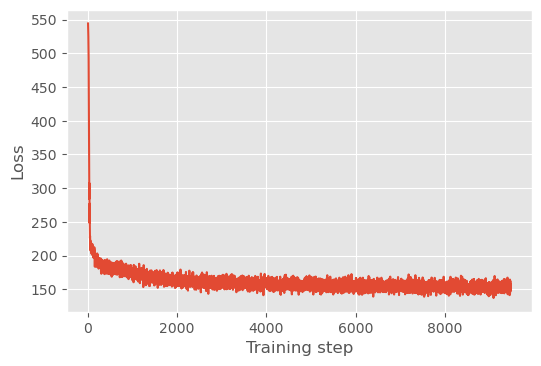

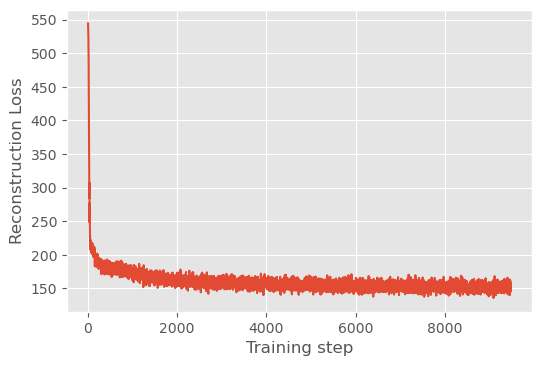

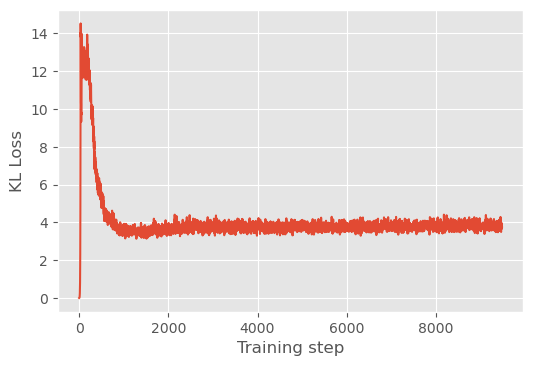

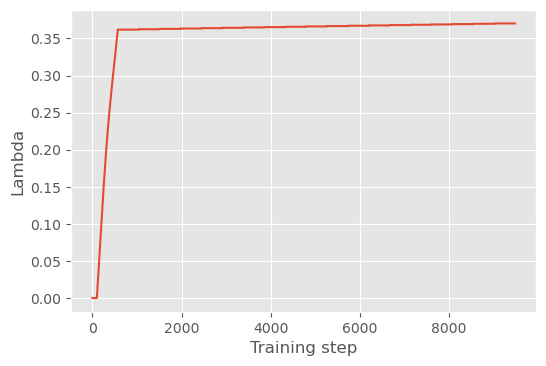

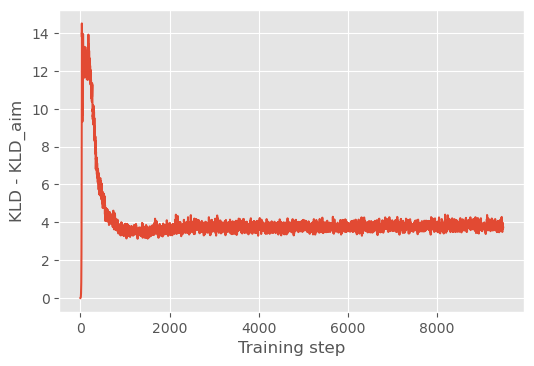

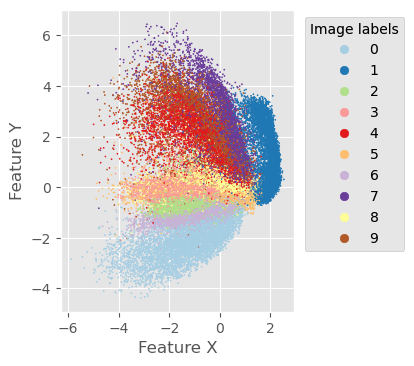

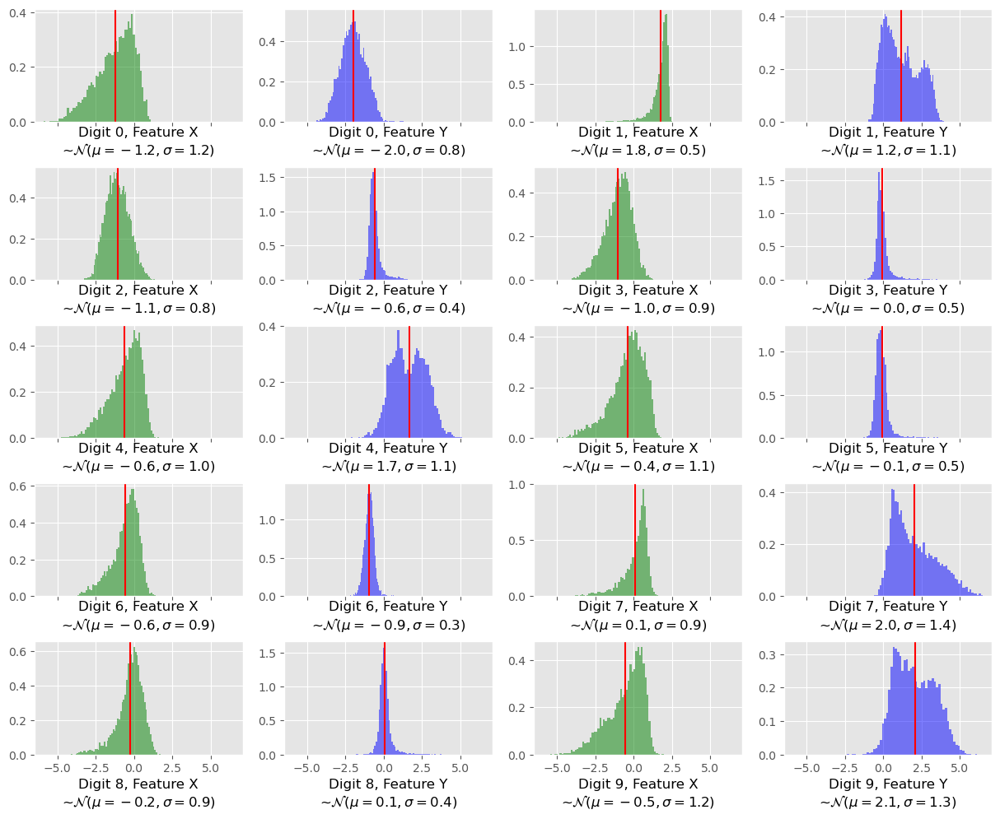

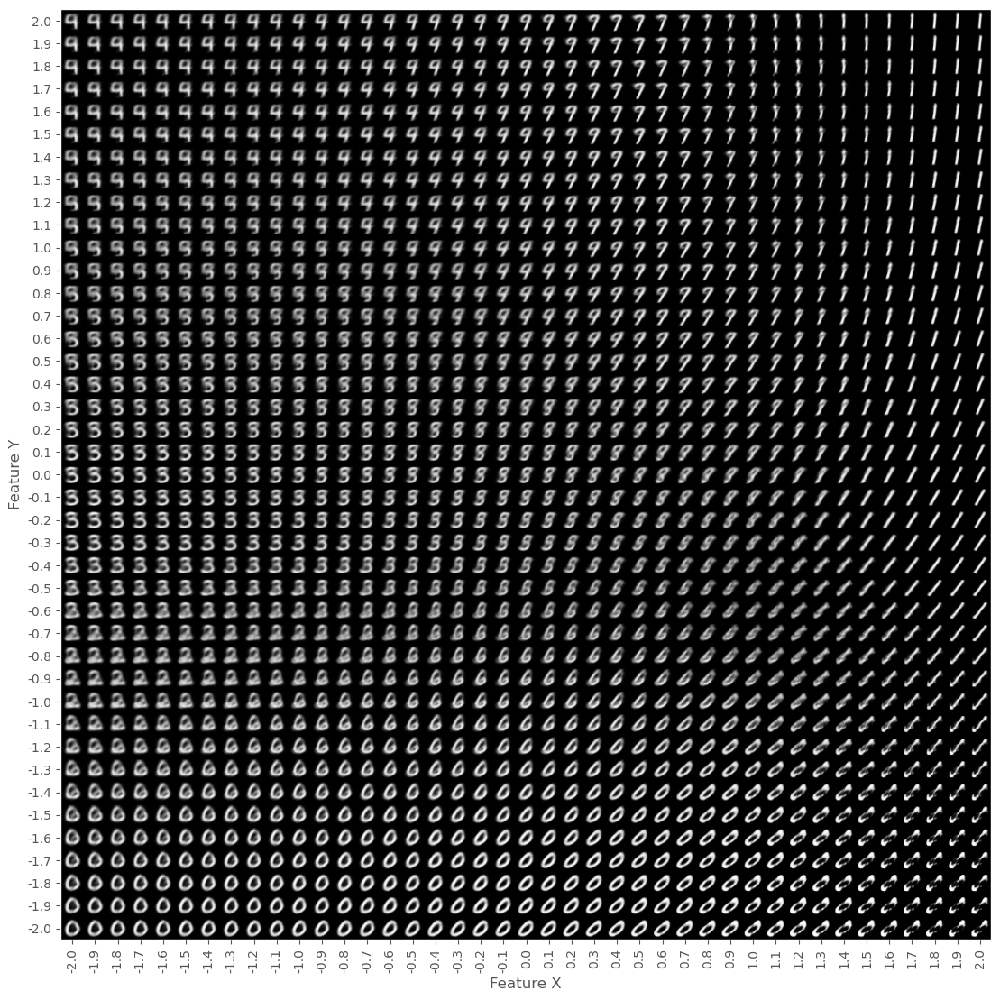

In [46]:
# plot losses
def plot_losses(losses):
    plt.figure(dpi=100)
    plt.plot(losses)
    plt.xlabel('Training step')
    plt.ylabel('Loss')
    # save
    # plt.savefig(f"figs/{KLD_aim}_KLD_aim/loss_{KLD_aim}_KLDaim.png")

# plot reconstruction losses
def plot_reconstruction_losses(reconstruction_losses):
    plt.figure(dpi=100)
    plt.plot(reconstruction_losses)
    plt.xlabel('Training step')
    plt.ylabel('Reconstruction Loss')
    # save
    # plt.savefig(f"figs/{KLD_aim}_KLD_aim/recnstr_loss_{KLD_aim}_KLDaim.png")

# plot kld losses
def plot_kld_lossses(kld_lossses):
    plt.figure(dpi=100)
    plt.plot(kld_losses)
    plt.xlabel('Training step')
    plt.ylabel('KL Loss')
    # save
    # plt.savefig(f"figs/{KLD_aim}_KLD_aim/kld_loss_{KLD_aim}_KLDaim.png")

# plot lambdas
def plot_lambdas(Lambdas):
    plt.figure(dpi=100)
    plt.plot(Lambdas)
    plt.xlabel('Training step')
    plt.ylabel('Lambda')
    # save
    # plt.savefig(f"figs/{KLD_aim}_KLD_aim/lambdas_{KLD_aim}_KLDaim.png")

# plot kld diffs
def plot_kld_diffs(kld_diff):
    plt.figure(dpi=100)
    plt.plot(kld_diff)
    plt.xlabel('Training step')
    plt.ylabel('KLD - KLD_aim')
    # save
    # plt.savefig(f"figs/{KLD_aim}_KLD_aim/kld_diff_{KLD_aim}_KLDaim.png")

# scatter plot of encodings in the latent space
def scatter_plot_encodings_latent(encodings, labels):
    plt.figure(dpi=100)
    scat = plt.scatter(encodings[:, 0], encodings[:, 1], c=labels, s=.5, cmap='Paired')
    plt.gca().add_artist(plt.legend(*scat.legend_elements(), 
                         title='Image labels', bbox_to_anchor=(1.5, 1.)))
    plt.xlabel('Feature X')
    plt.ylabel('Feature Y')
    plt.gca().set_aspect(1)
    plt.show()
    
# histogram plot of encodings in the latent space
def hist_plot_encodings_latent(encodings, labels, digit, dim, ax):
    # extract
    encodings_digit = encodings[labels == digit, dim]
    # histogram
    ax.hist(encodings_digit, bins=60, density=True, color=['g', 'b'][dim], alpha=.5)
    # mean and std dev
    mean = np.mean(encodings_digit)
    std = np.std(encodings_digit)
    ax.axvline(mean, c='r')
    ax.set_xlabel('Digit %d, Feature %s\n~${\cal N}(\mu=%.1f, \sigma=%.1f)$' % 
                  (digit, ['X', 'Y'][dim], mean, std), c='k')
    
# generate images from the latent space
def generate_images_latent(decoder, x0, x1, dx, y0, y1, dy):
    # uniformly sample the latent space
    nx = round((x1 - x0) / dx) + 1
    ny = round((y1 - y0) / dy) + 1
    grid_x = np.linspace(x0, x1, nx)
    grid_y = np.linspace(y1, y0, ny)
    latent = np.array(np.meshgrid(grid_x, grid_y)).reshape(2, nx * ny).T

    # decode images
    decodings = decoder.predict(latent)
    
    # display a (nx, ny) 2D manifold of digits
    figure = np.zeros((28 * ny, 28 * nx))
    for iy in np.arange(ny):
        for ix in np.arange(nx):
            figure[iy * 28 : (iy + 1) * 28, ix * 28 : (ix + 1) * 28] = decodings[iy * nx + ix]
            
    # plot figure
    plt.figure(dpi=100, figsize=(nx / 3, ny / 3))
    plt.xticks(np.arange(28 // 2, nx * 28 + 28 // 2, 28), np.round(grid_x, 1), rotation=90)
    plt.yticks(np.arange(28 // 2, ny * 28 + 28 // 2, 28), np.round(grid_y, 1))
    plt.xlabel('Feature X')
    plt.ylabel('Feature Y')
    plt.imshow(figure, cmap="Greys_r")
    plt.grid(False)
    plt.show()

# plot losses
plot_losses(losses)
plot_reconstruction_losses(reconstruction_losses)
plot_kld_lossses(kld_losses)
plot_lambdas(Lambdas)
plot_kld_diffs(kld_diff)

# encode images by BVAE
train_encodings_BVAE = encoder_VAE.predict(train_images)

# scatter plot of encodings by BVAE
scatter_plot_encodings_latent(train_encodings_BVAE[2], train_labels)

# histogram plot of encodings by BVAE
fig, axes = plt.subplots(5, 4, dpi=100, figsize=(15, 12), sharex=True)
plt.subplots_adjust(hspace=.4)
for digit in range(10):
    hist_plot_encodings_latent(train_encodings_BVAE[2], train_labels, digit, 0, 
                               axes[digit // 2, digit % 2 * 2 + 0])
    hist_plot_encodings_latent(train_encodings_BVAE[2], train_labels, digit, 1, 
                               axes[digit // 2, digit % 2 * 2 + 1])
plt.show()

# generate images by BVAE
generate_images_latent(decoder_VAE, x0=-2, x1=2, dx=.1, y0=-2, y1=2, dy=.1)